# Task 1 - Distribution of genes among the different clusters
This notebook analyses the distribution of individual genes among the different clusters.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import os
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

### Load adata

In [3]:
adata = sc.read_h5ad('../data/adata/processed_adata1.h5ad')
adata.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors
AAACCCAAGATCACCT-1-1-0-0,9591-2D,0,mouse,1438,7.271704,3167.0,8.060856,31.796653,43.195453,54.152195,70.382065,158.0,5.068904,4.988949,8.060540,3167.0,1438,0.776404
AAACCCAAGCACACAG-1-1-0-0,9591-2D,0,mouse,2030,7.616284,5085.0,8.534247,28.456244,40.255654,50.855457,66.096362,255.0,5.545177,5.014749,8.534050,5085.0,2030,1.230932
AAACCCAAGGCATCTT-1-1-0-0,9591-2D,0,mouse,1581,7.366445,3452.0,8.146998,32.097335,43.134415,53.418308,68.684820,213.0,5.365976,6.170336,8.146709,3452.0,1581,0.795952
AAACCCAAGGGTAGCT-1-1-0-0,9591-2D,0,mouse,2930,7.983099,9941.0,9.204523,34.513630,46.604969,55.577910,67.629011,885.0,6.786717,8.902525,9.204423,9941.0,2930,2.054774
AAACCCACACACGGTC-1-1-0-0,9591-2D,0,mouse,650,6.478510,1089.0,6.993933,32.690542,43.801653,58.677686,86.225895,51.0,3.951244,4.683196,6.993015,1089.0,650,0.266634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAGCTAAA-1-1-0-0,9591-2D,0,mouse,3308,8.104401,11144.0,9.318747,29.872577,41.358579,51.390883,64.348528,451.0,6.113682,4.047021,9.318657,11144.0,3308,2.691594
TTTGTTGGTTGCTCGG-1-1-0-0,9591-2D,0,mouse,546,6.304449,970.0,6.878326,38.556701,51.340206,64.329897,95.257732,122.0,4.812184,12.577319,6.877296,970.0,546,0.206866
TTTGTTGTCCACTTTA-1-1-0-0,9591-2D,0,mouse,433,6.073045,594.0,6.388561,30.639731,43.939394,60.774411,100.000000,23.0,3.178054,3.872054,6.386879,594.0,433,0.144676
TTTGTTGTCCCGTTGT-1-1-0-0,9591-2D,0,mouse,1063,6.969791,1920.0,7.560601,30.729167,41.197917,52.343750,70.677083,75.0,4.330733,3.906250,7.560081,1920.0,1063,0.464146


<a id="Clustering"></a>

## Clustering

In [4]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.55, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)


In [5]:
adata.obs['louvain_r0.5'].value_counts()

0    7399
1    4988
2    3006
3     927
4     427
Name: louvain_r0.5, dtype: int64

In [6]:
adata.obs['louvain_r1'].value_counts()

0    4186
1    3828
2    3780
3    2536
4     984
5     967
6     466
Name: louvain_r1, dtype: int64

After discussion with our team, we decided to continue with louvain_r0.5, which has a resolution of 0.55

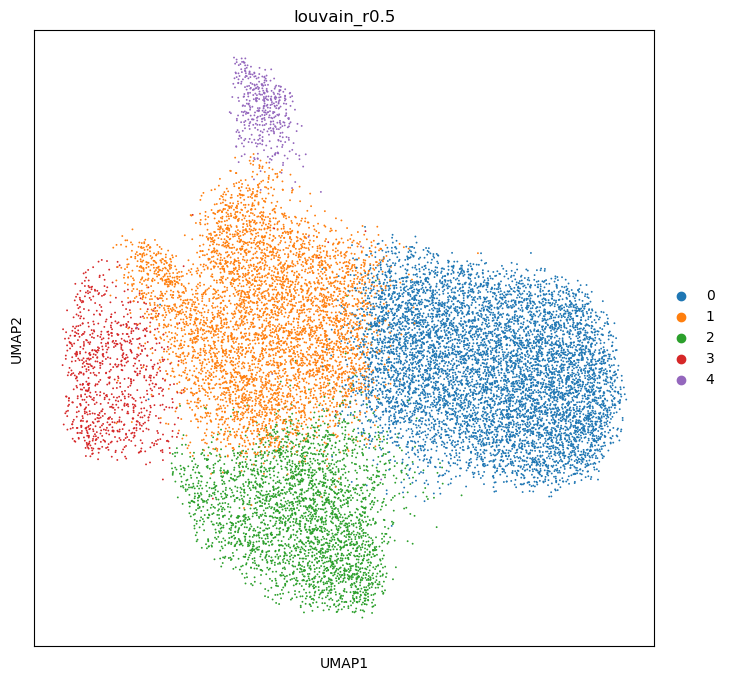

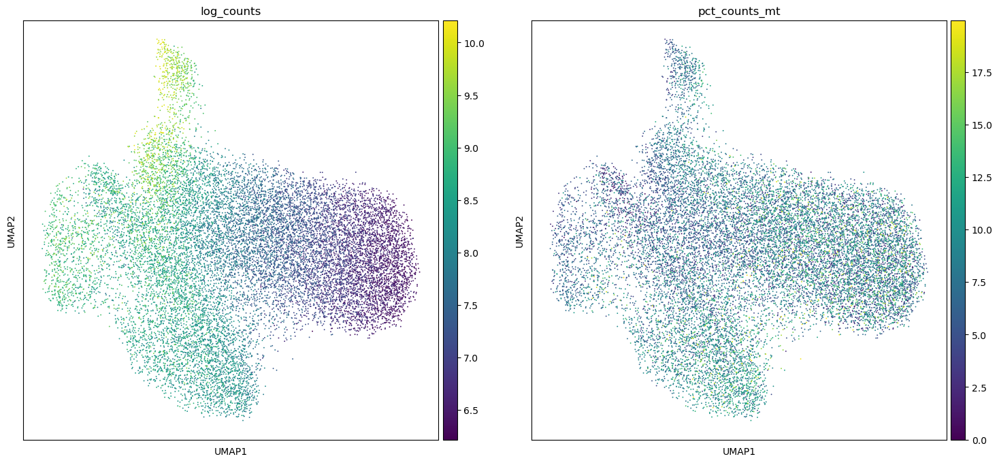

In [7]:
sc.pl.umap(adata, color=['louvain_r0.5'], save='/9591-2D/UMAP.pdf')
os.rename("figures/umap/9591-2D/UMAP.pdf", 
          "../results/task1/9591-2D/UMAP.pdf")

sc.pl.umap(adata, color=['log_counts', 'pct_counts_mt'], save='/9591-2D/UMAP_counts.pdf')
os.rename("figures/umap/9591-2D/UMAP_counts.pdf", 
          "../results/task1/9591-2D/UMAP_counts.pdf")

<a id="Markers"></a>

## Marker genes & cluster annotation

In [8]:
#Calculate marker genes
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.5', key_added='rank_genes_r0.5')

ranking genes
    finished: added to `.uns['rank_genes_r0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


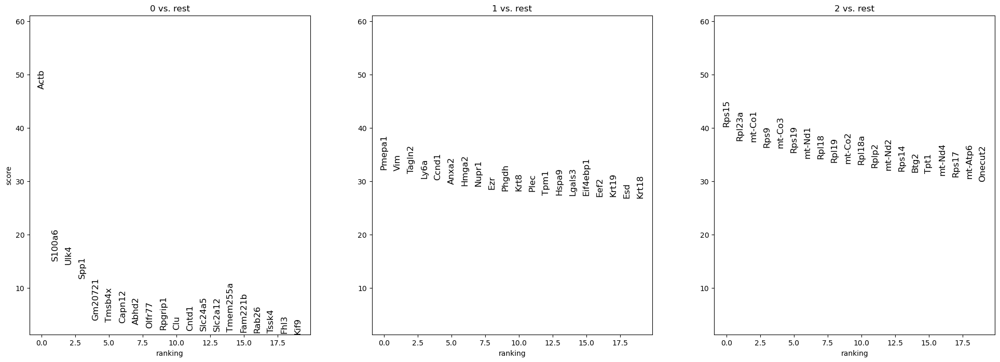

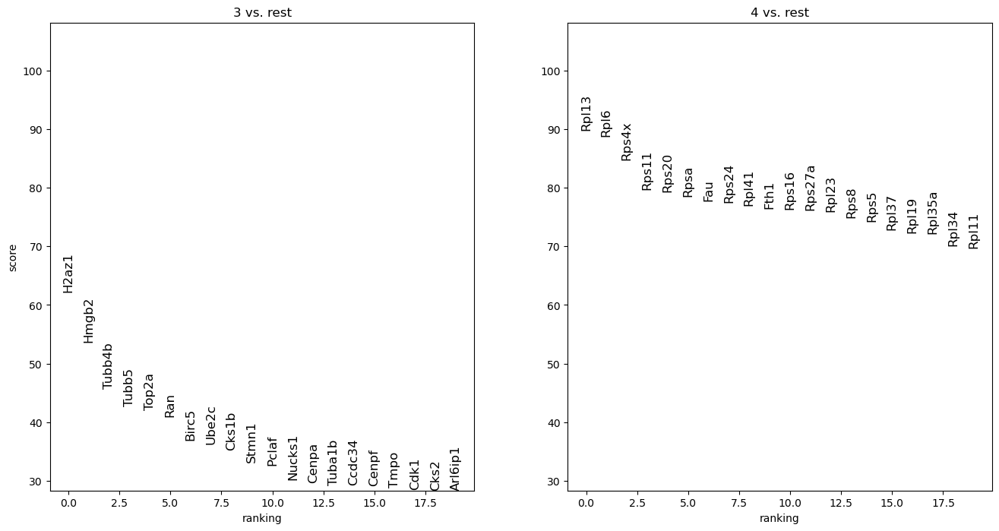

In [9]:
#Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['3','4'], fontsize=12)

In [10]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Below we plot genes of particular interest within the clusters

### Cluster 0

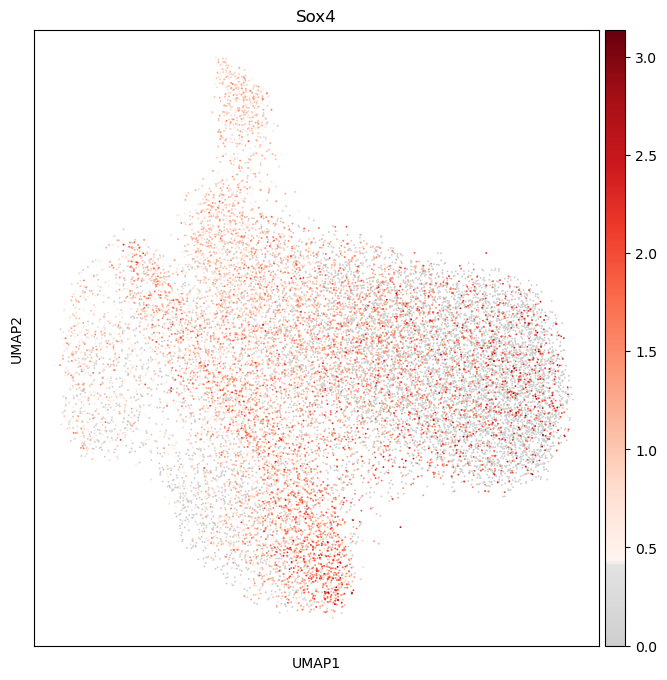

In [11]:
# Sox4
sc.pl.umap(adata, color='Sox4', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Sox4.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Sox4.pdf", 
          "../results/task1/9591-2D/Cluster0/Sox4.pdf")

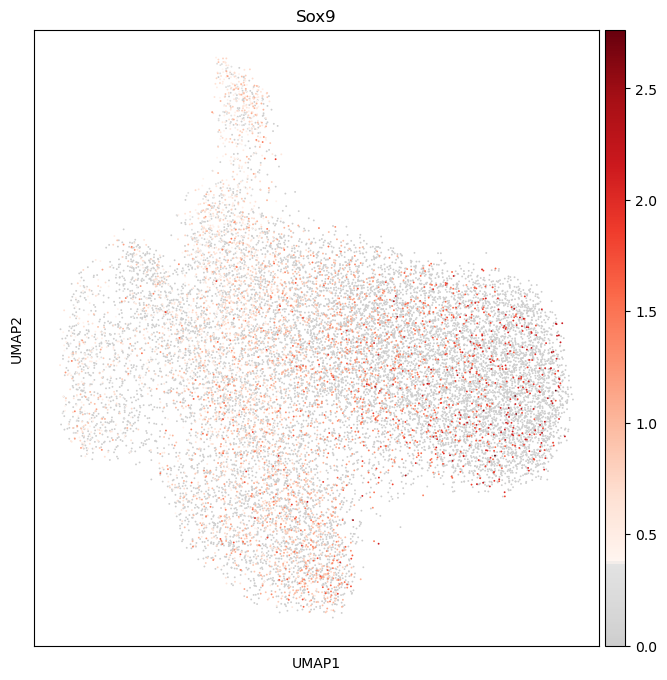

In [12]:
# Sox9
sc.pl.umap(adata, color='Sox9', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Sox9.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Sox9.pdf", 
          "../results/task1/9591-2D/Cluster0/Sox9.pdf")

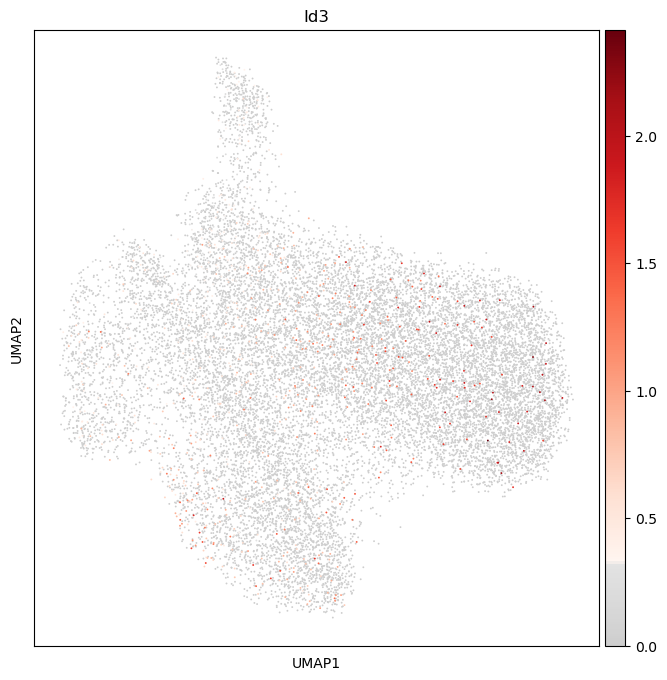

In [13]:
# Id3
sc.pl.umap(adata, color='Id3', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Id3.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Id3.pdf", 
          "../results/task1/9591-2D/Cluster0/Id3.pdf")

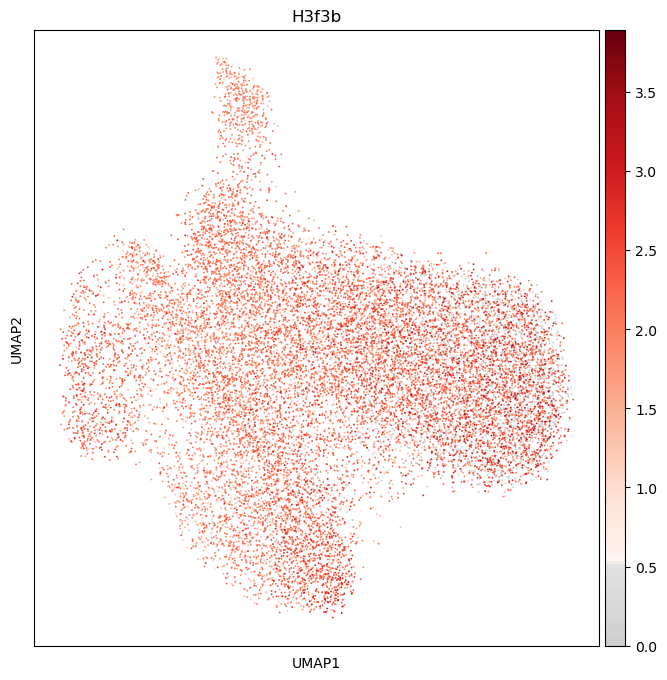

In [14]:
# H3f3b
sc.pl.umap(adata, color='H3f3b', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/H3f3b.pdf')
os.rename("figures/umap/9591-2D/Cluster0/H3f3b.pdf", 
          "../results/task1/9591-2D/Cluster0/H3f3b.pdf")

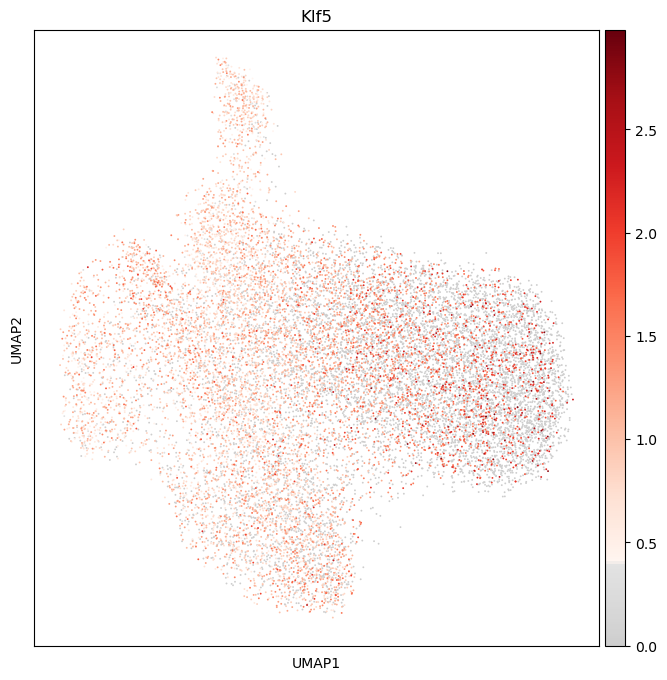

In [15]:
# Klf5
sc.pl.umap(adata, color='Klf5', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Klf5.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Klf5.pdf", 
          "../results/task1/9591-2D/Cluster0/Klf5.pdf")

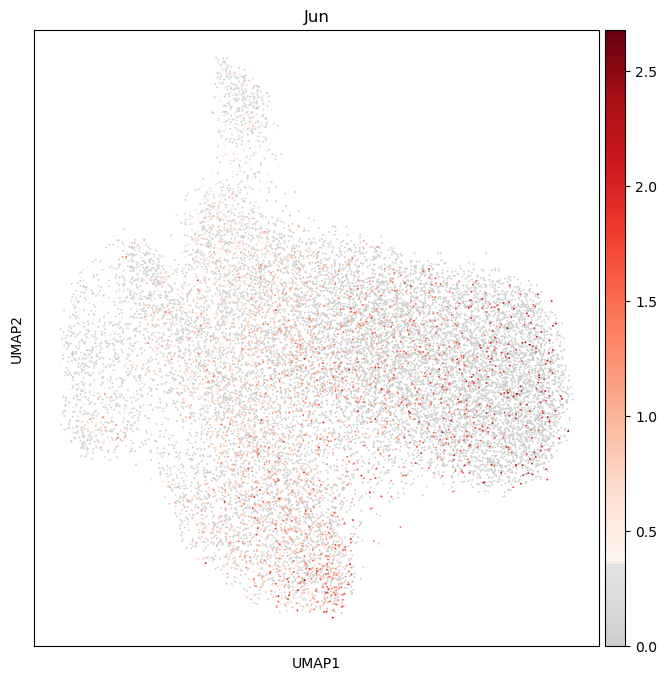

In [16]:
# Jun
sc.pl.umap(adata, color='Jun', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Jun.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Jun.pdf", 
          "../results/task1/9591-2D/Cluster0/Jun.pdf")

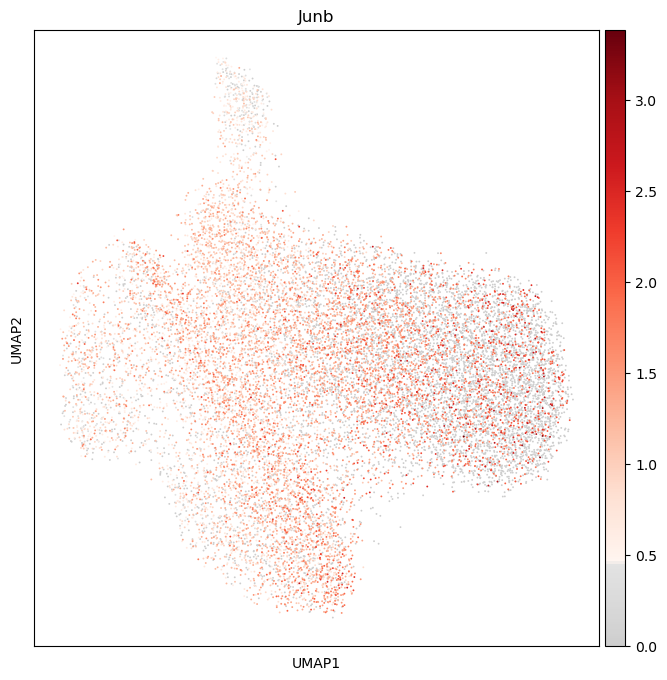

In [17]:
# Junb
sc.pl.umap(adata, color='Junb', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Junb.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Junb.pdf", 
          "../results/task1/9591-2D/Cluster0/Junb.pdf")

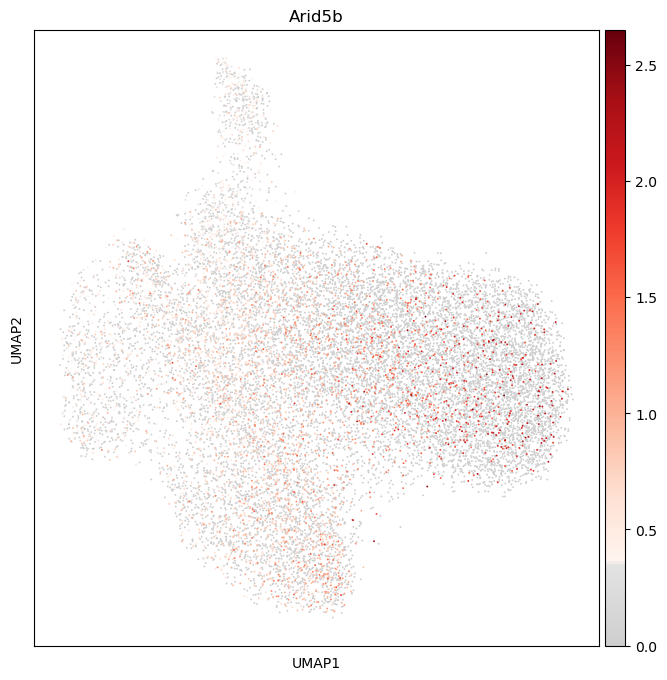

In [18]:
# Arid5b
sc.pl.umap(adata, color='Arid5b', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Arid5b.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Arid5b.pdf", 
          "../results/task1/9591-2D/Cluster0/Arid5b.pdf")

### Cluster 1

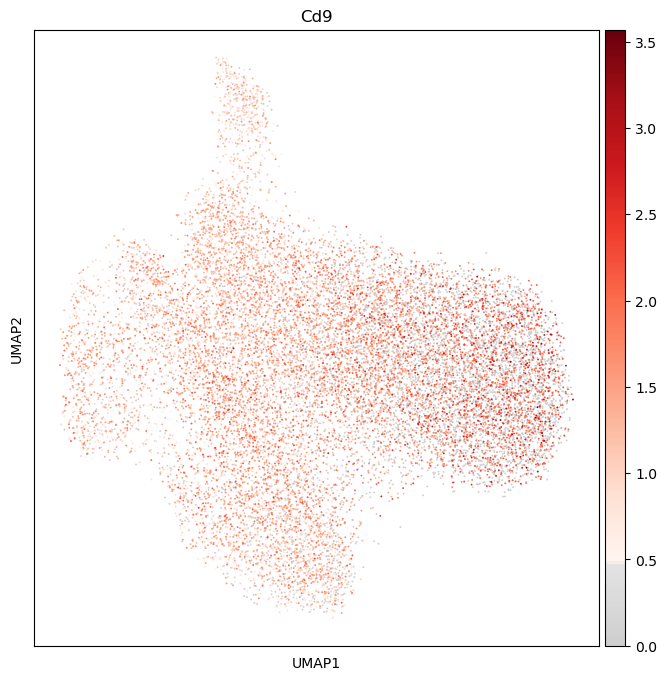

In [19]:
# Cd9
sc.pl.umap(adata, color='Cd9', use_raw=False, color_map=mymap, save='/9591-2D/Cluster1/Cd9.pdf')
os.rename("figures/umap/9591-2D/Cluster1/Cd9.pdf", 
          "../results/task1/9591-2D/Cluster1/Cd9.pdf")

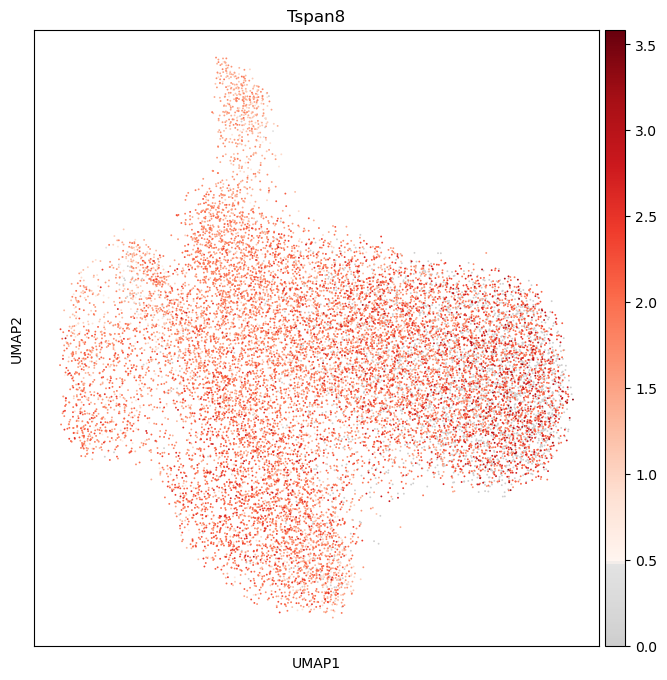

In [20]:
# Tspan8
sc.pl.umap(adata, color='Tspan8', use_raw=False, color_map=mymap, save='/9591-2D/Cluster1/Tspan8.pdf')
os.rename("figures/umap/9591-2D/Cluster1/Tspan8.pdf", 
          "../results/task1/9591-2D/Cluster1/Tspan8.pdf")

### Cluster 2

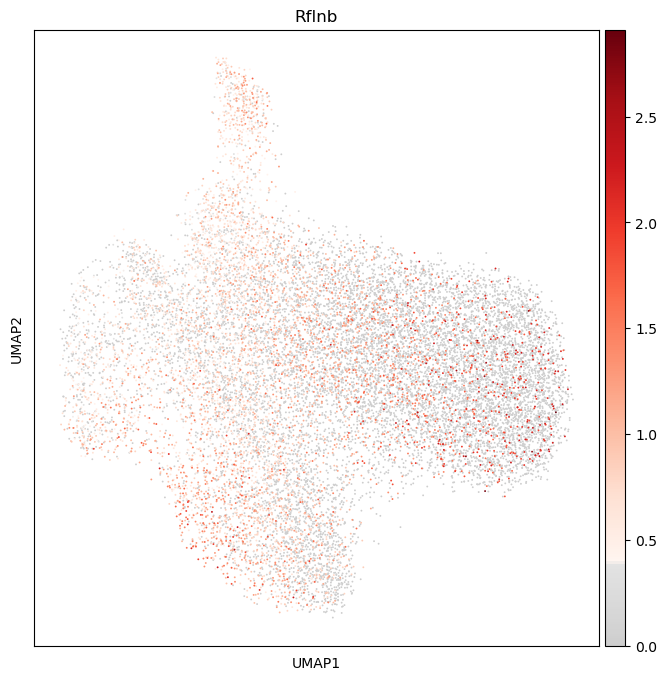

In [21]:
# Rflnb
sc.pl.umap(adata, color='Rflnb', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Rflnb.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Rflnb.pdf", 
          "../results/task1/9591-2D/Cluster2/Rflnb.pdf")

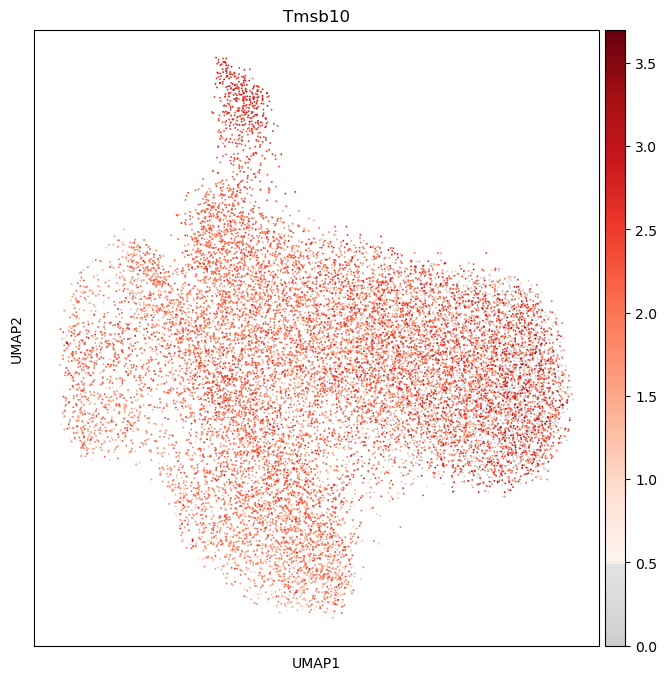

In [22]:
# Tmsb10
sc.pl.umap(adata, color='Tmsb10', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Tmsb10.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Tmsb10.pdf", 
          "../results/task1/9591-2D/Cluster2/Tmsb10.pdf")

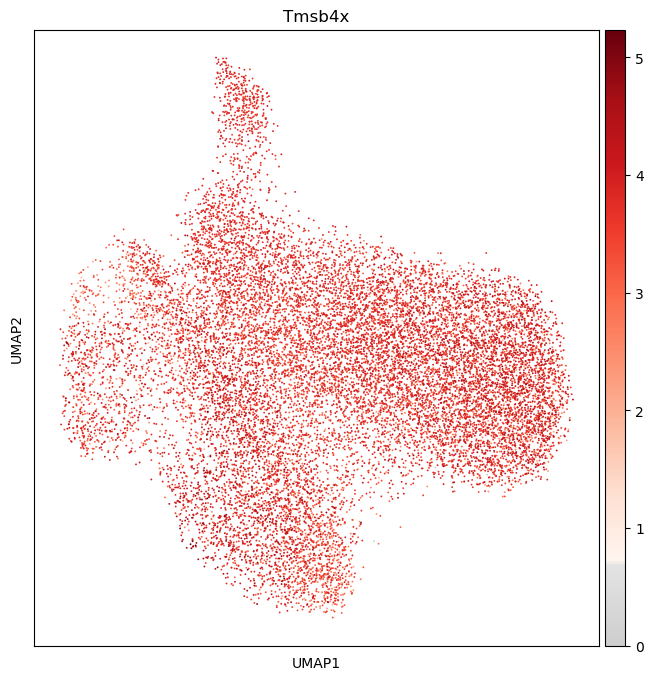

In [23]:
# Tmsb4x
sc.pl.umap(adata, color='Tmsb4x', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Tmsb4x.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Tmsb4x.pdf", 
          "../results/task1/9591-2D/Cluster2/Tmsb4x.pdf")

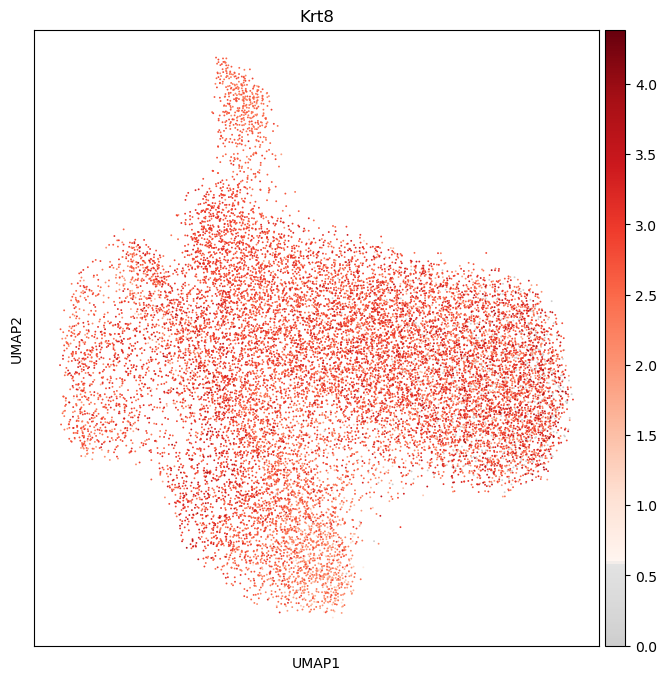

In [24]:
# Krt8
sc.pl.umap(adata, color='Krt8', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Krt8.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Krt8.pdf", 
          "../results/task1/9591-2D/Cluster2/Krt8.pdf")

### Cluster 3

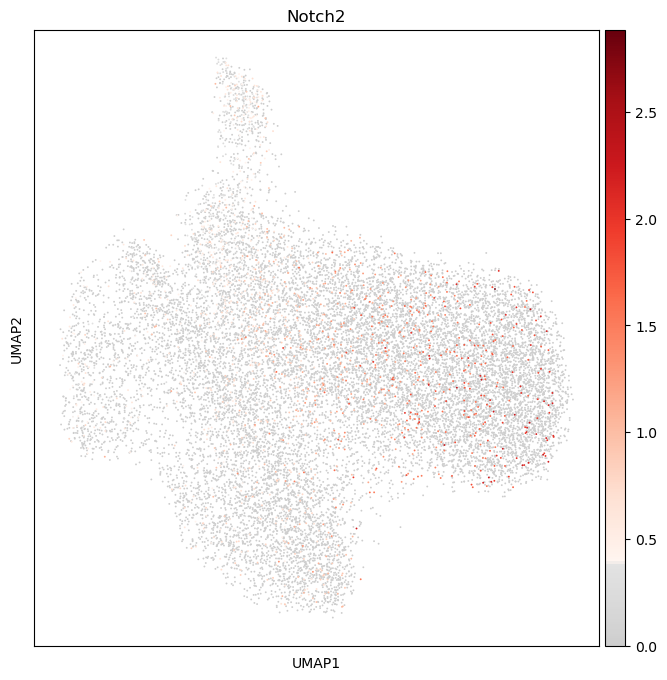

In [25]:
# Notch2
sc.pl.umap(adata, color='Notch2', use_raw=False, color_map=mymap, save='/9591-2D/Cluster3/Notch2.pdf')
os.rename("figures/umap/9591-2D/Cluster3/Notch2.pdf", 
          "../results/task1/9591-2D/Cluster3/Notch2.pdf")

### Cluster 4

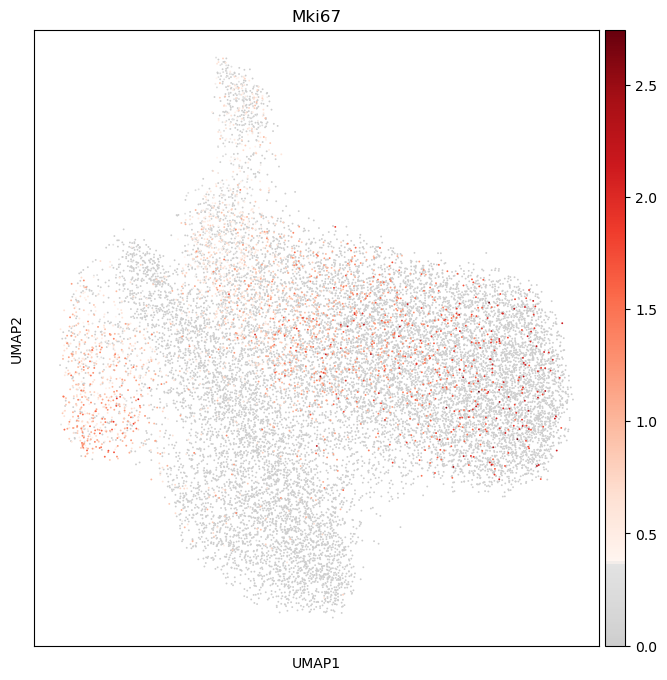

In [26]:
# Mki67
sc.pl.umap(adata, color='Mki67', use_raw=False, color_map=mymap, save='/9591-2D/Cluster4/Mki67.pdf')
os.rename("figures/umap/9591-2D/Cluster4/Mki67.pdf", 
          "../results/task1/9591-2D/Cluster4/Mki67.pdf")

### New Set
9591:
Ulk4
Spp1
Spry2
Notch2
Kif9
Mik67
H2az1
Ran
Tagln2
Ccnd1
Pmepa1
Lmna
Ezr
Tpm1
Tpt1
Btg2
Ecf2
Onecut2
Fth1

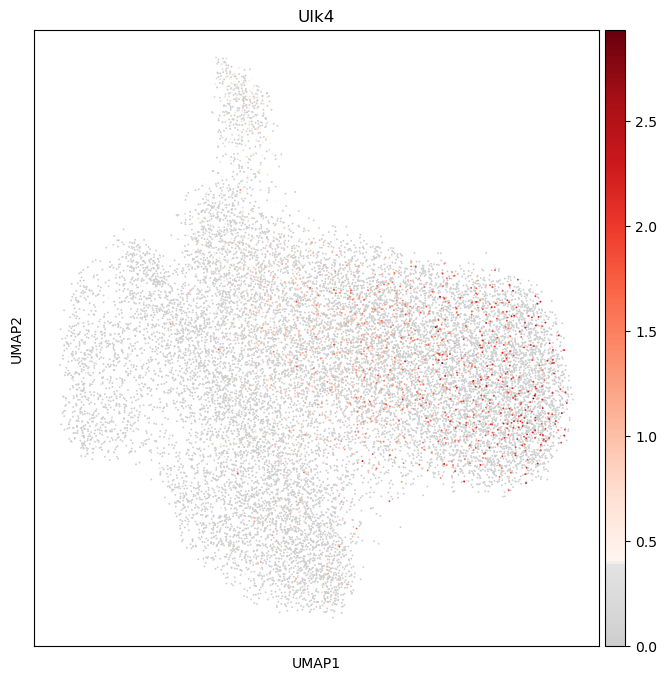

In [27]:
# Ulk4
sc.pl.umap(adata, color='Ulk4', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ulk4.pdf')
os.rename("figures/umap/9591-2D/New_set/Ulk4.pdf", 
          "../results/task1/9591-2D/New_set/Ulk4.pdf")

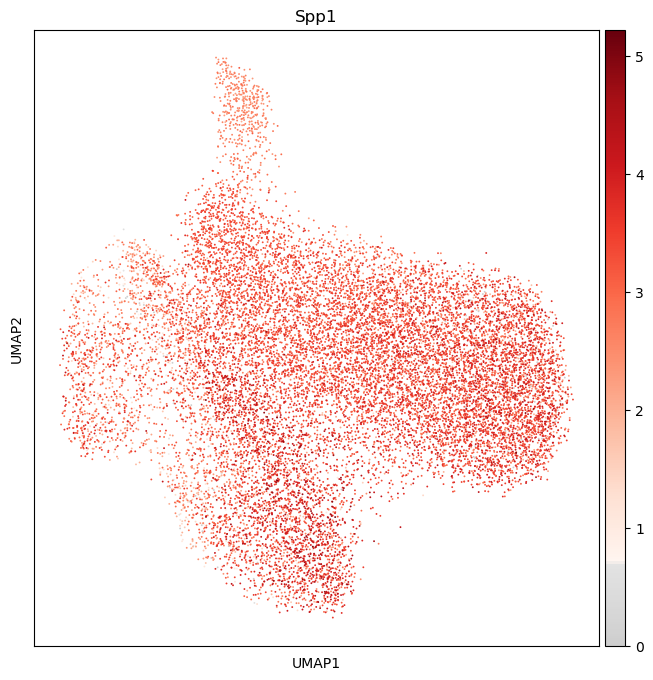

In [28]:
# Spp1
sc.pl.umap(adata, color='Spp1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Spp1.pdf')
os.rename("figures/umap/9591-2D/New_set/Spp1.pdf", 
          "../results/task1/9591-2D/New_set/Spp1.pdf")

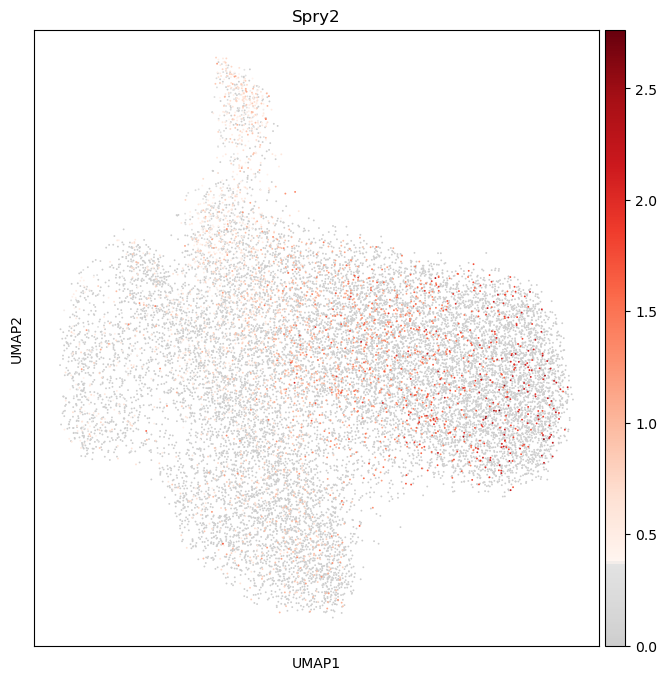

In [29]:
# Spry2
sc.pl.umap(adata, color='Spry2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Spry2.pdf')
os.rename("figures/umap/9591-2D/New_set/Spry2.pdf", 
          "../results/task1/9591-2D/New_set/Spry2.pdf")

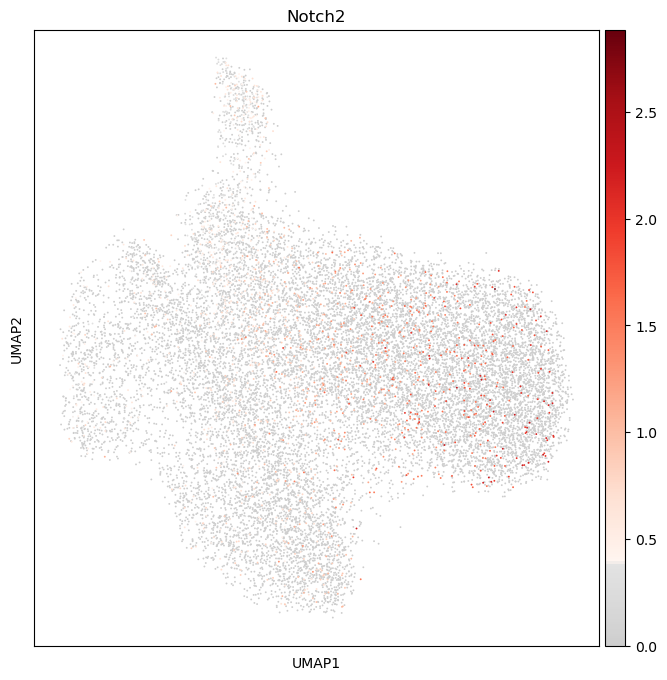

In [30]:
# Notch2
sc.pl.umap(adata, color='Notch2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Notch2.pdf')
os.rename("figures/umap/9591-2D/New_set/Notch2.pdf", 
          "../results/task1/9591-2D/New_set/Notch2.pdf")

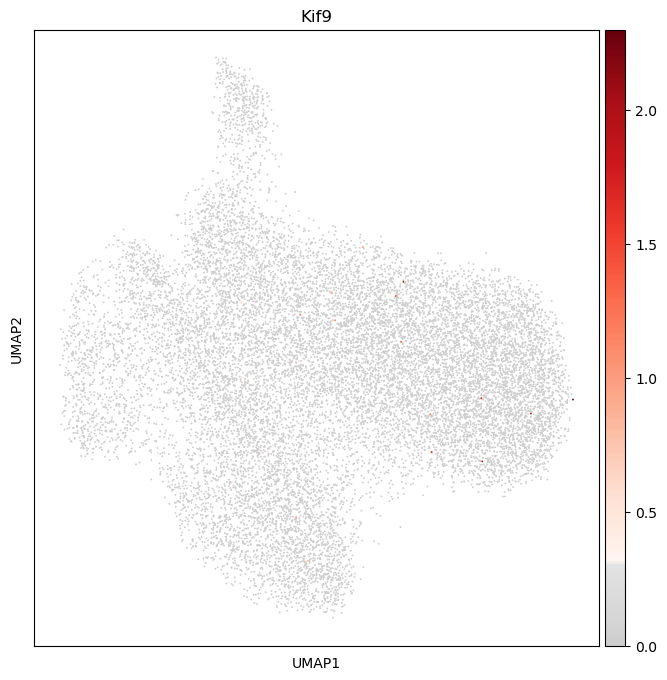

In [31]:
# Kif9
sc.pl.umap(adata, color='Kif9', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Kif9.pdf')
os.rename("figures/umap/9591-2D/New_set/Kif9.pdf", 
          "../results/task1/9591-2D/New_set/Kif9.pdf")

False
True


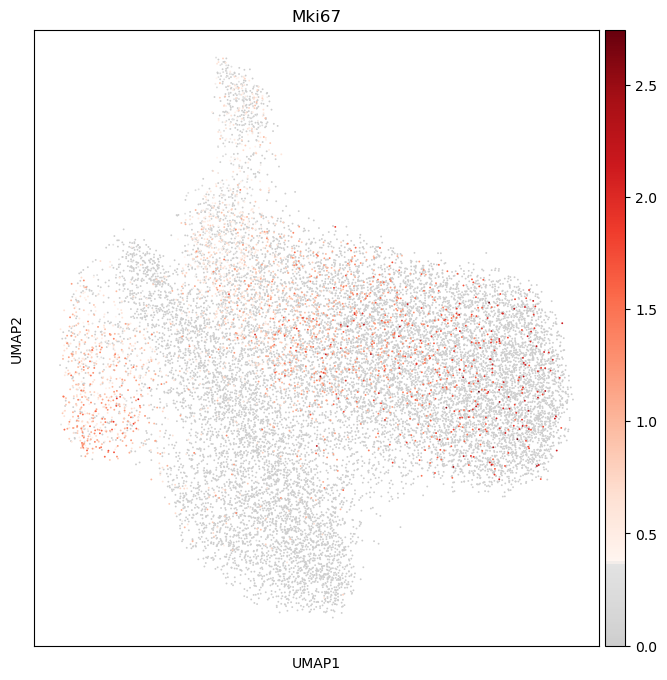

In [32]:
# Mik67 is not a var name!
# sc.pl.umap(adata, color='Mik67', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Mik67.pdf')
# os.rename("figures/umap/9591-2D/New_set/Mik67.pdf", 
#           "../results/task1/9591-2D/New_set/Mik67.pdf")
print('Mik67' in adata.var_names.tolist())
# Did you mean 'Mki67'?
print('Mki67' in adata.var_names.tolist())
sc.pl.umap(adata, color='Mki67', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Mki67.pdf')
os.rename("figures/umap/9591-2D/New_set/Mki67.pdf", 
          "../results/task1/9591-2D/New_set/Mki67.pdf")

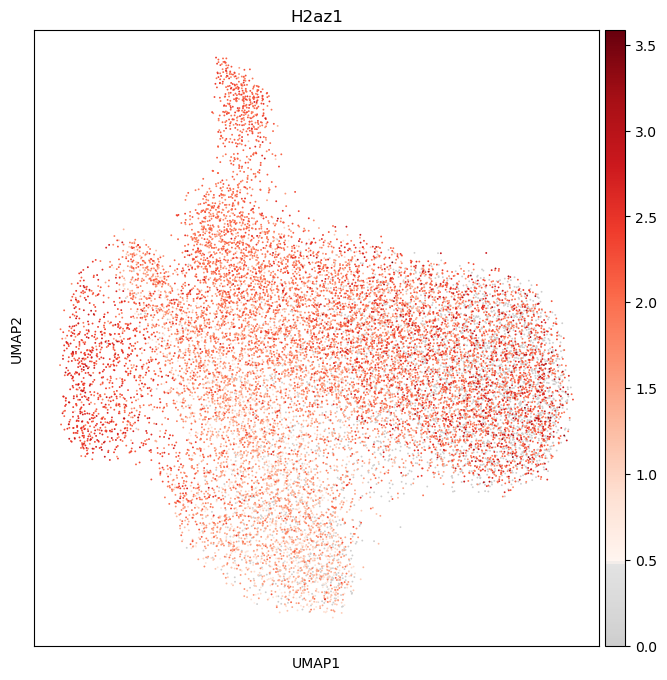

In [33]:
# H2az1
sc.pl.umap(adata, color='H2az1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/H2az1.pdf')
os.rename("figures/umap/9591-2D/New_set/H2az1.pdf", 
          "../results/task1/9591-2D/New_set/H2az1.pdf")

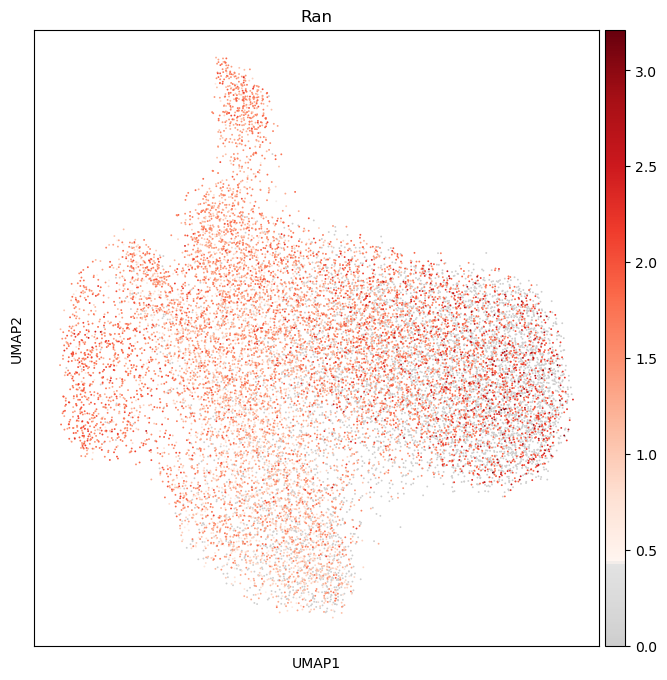

In [34]:
# Ran
sc.pl.umap(adata, color='Ran', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ran.pdf')
os.rename("figures/umap/9591-2D/New_set/Ran.pdf", 
          "../results/task1/9591-2D/New_set/Ran.pdf")

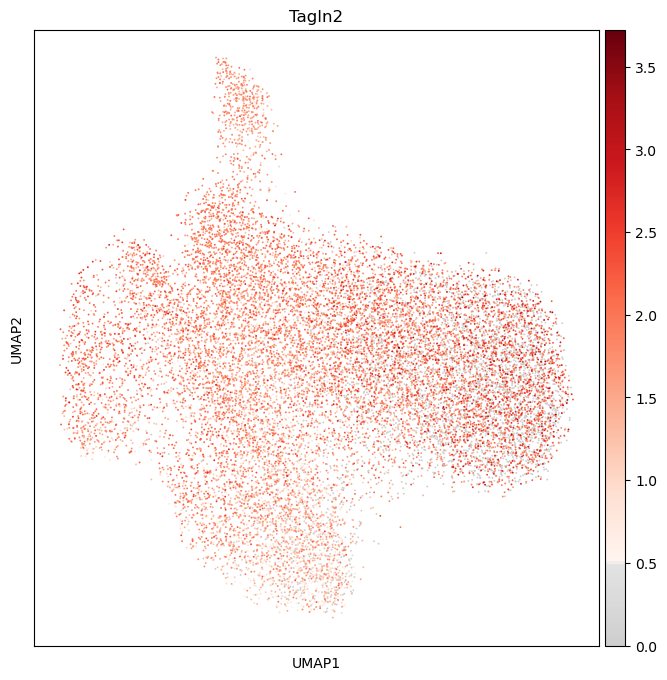

In [35]:
# Tagln2
sc.pl.umap(adata, color='Tagln2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tagln2.pdf')
os.rename("figures/umap/9591-2D/New_set/Tagln2.pdf", 
          "../results/task1/9591-2D/New_set/Tagln2.pdf")

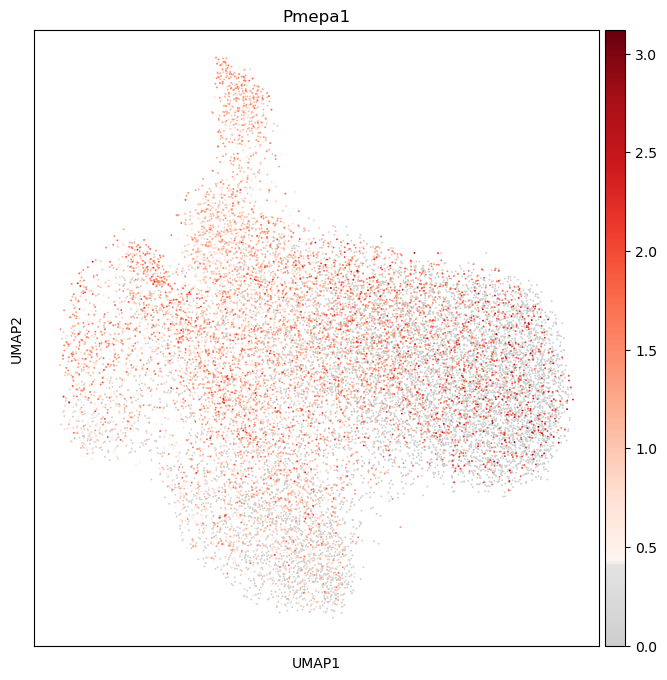

In [36]:
# Pmepa1
sc.pl.umap(adata, color='Pmepa1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Pmepa1.pdf')
os.rename("figures/umap/9591-2D/New_set/Pmepa1.pdf", 
          "../results/task1/9591-2D/New_set/Pmepa1.pdf")

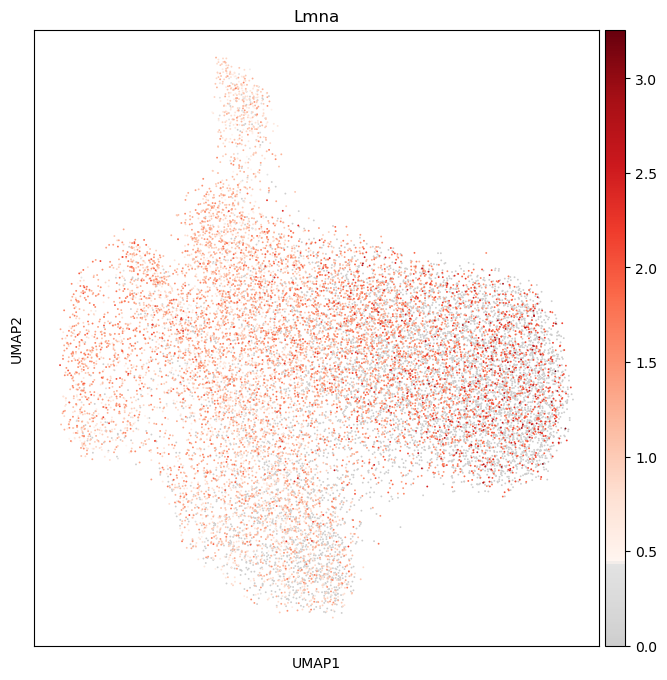

In [37]:
# Lmna
sc.pl.umap(adata, color='Lmna', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Lmna.pdf')
os.rename("figures/umap/9591-2D/New_set/Lmna.pdf", 
          "../results/task1/9591-2D/New_set/Lmna.pdf")

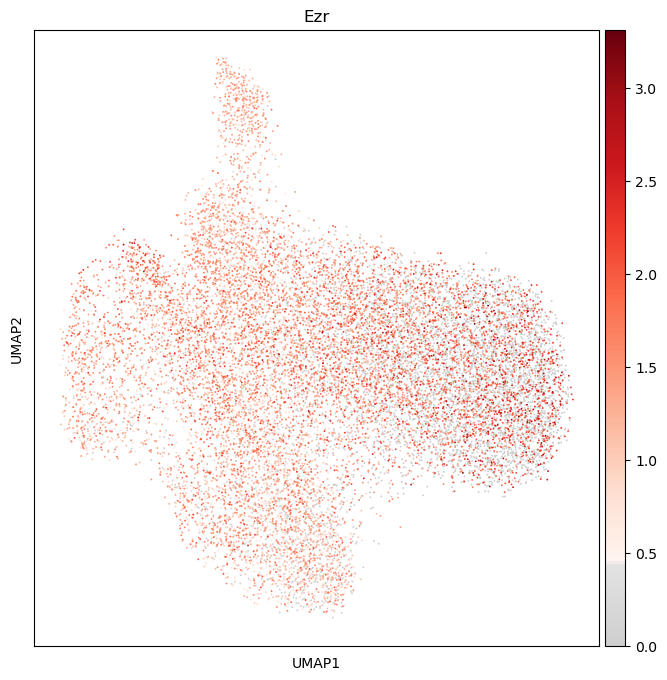

In [38]:
# Ezr
sc.pl.umap(adata, color='Ezr', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ezr.pdf')
os.rename("figures/umap/9591-2D/New_set/Ezr.pdf", 
          "../results/task1/9591-2D/New_set/Ezr.pdf")

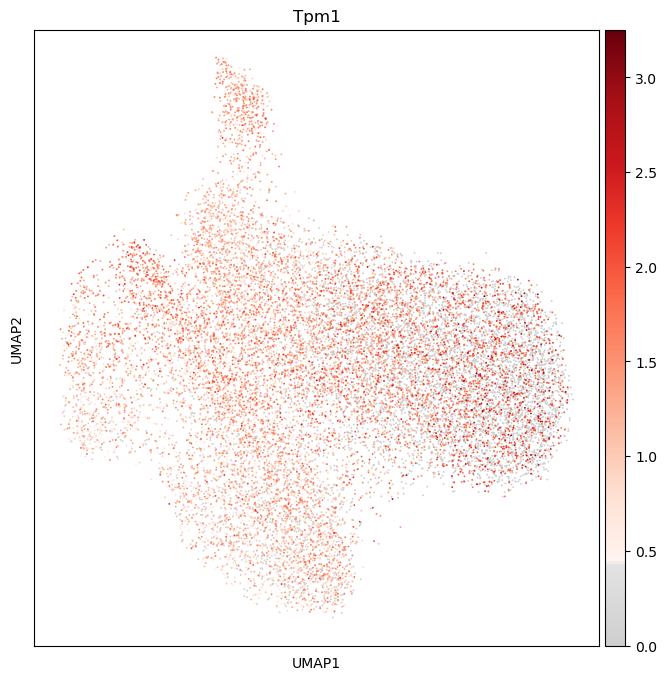

In [39]:
# Tpm1
sc.pl.umap(adata, color='Tpm1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tpm1.pdf')
os.rename("figures/umap/9591-2D/New_set/Tpm1.pdf", 
          "../results/task1/9591-2D/New_set/Tpm1.pdf")

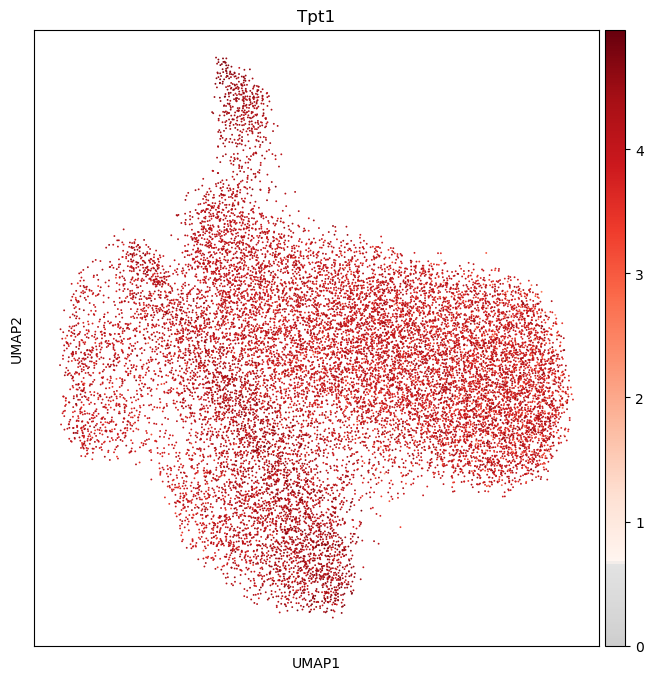

In [40]:
# Tpt1
sc.pl.umap(adata, color='Tpt1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tpt1.pdf')
os.rename("figures/umap/9591-2D/New_set/Tpt1.pdf", 
          "../results/task1/9591-2D/New_set/Tpt1.pdf")

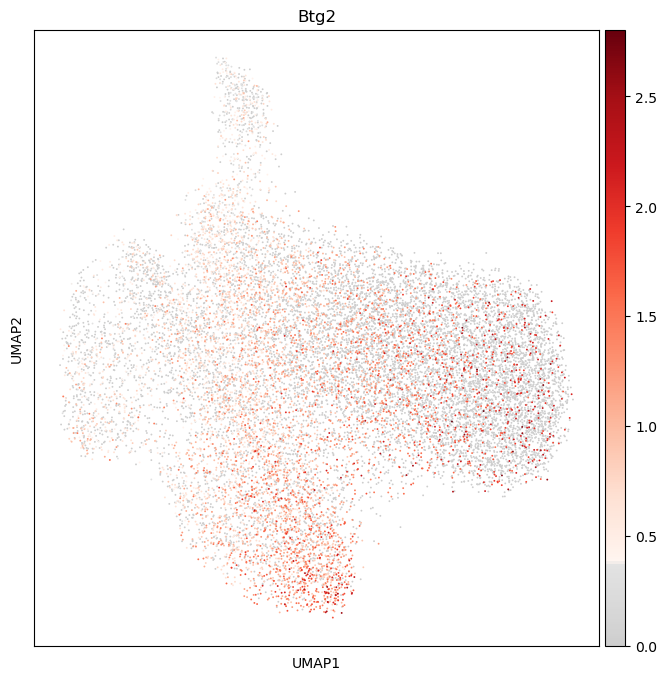

In [41]:
# Btg2
sc.pl.umap(adata, color='Btg2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Btg2.pdf')
os.rename("figures/umap/9591-2D/New_set/Btg2.pdf", 
          "../results/task1/9591-2D/New_set/Btg2.pdf")

In [42]:
# Ecf2
# sc.pl.umap(adata, color='Ecf2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ecf2.pdf')
# os.rename("figures/umap/9591-2D/New_set/Ecf2.pdf", 
#           "../results/task1/9591-2D/New_set/Ecf2.pdf")
print('Ecf2' in adata.var_names.tolist())

False


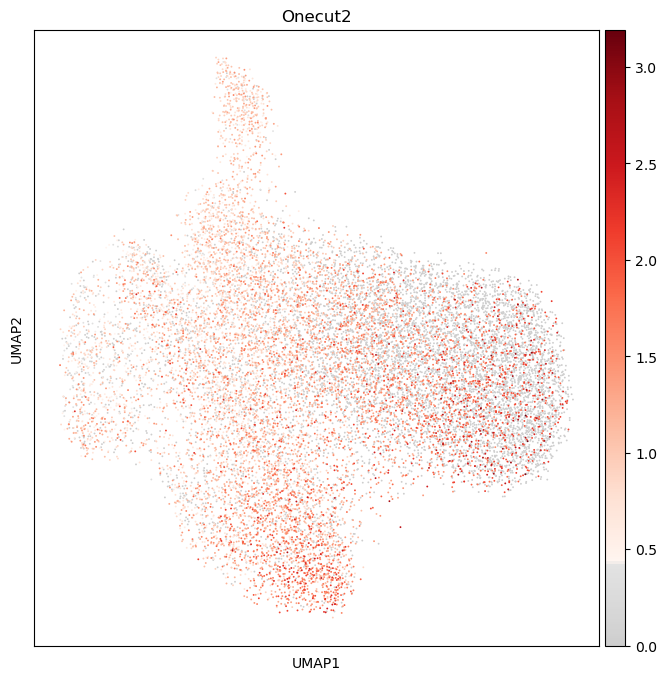

In [43]:
# Onecut2
sc.pl.umap(adata, color='Onecut2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Onecut2.pdf')
os.rename("figures/umap/9591-2D/New_set/Onecut2.pdf", 
          "../results/task1/9591-2D/New_set/Onecut2.pdf")

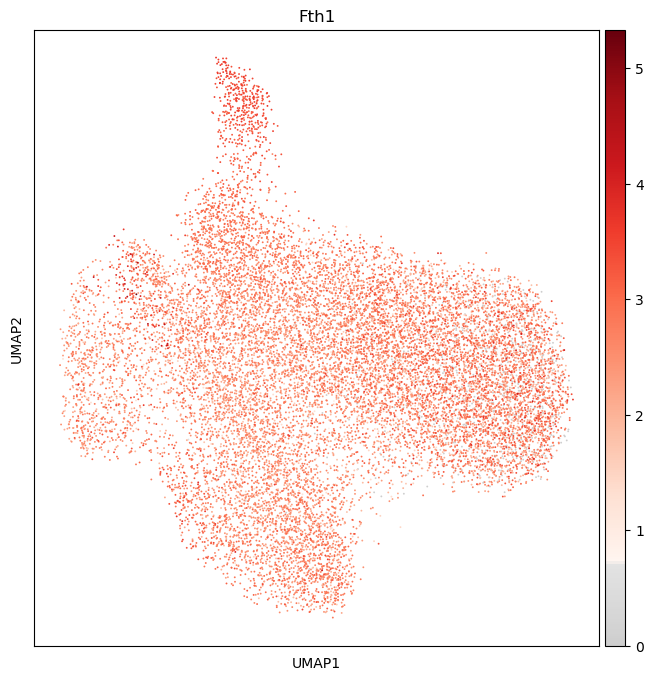

In [44]:
# Fth1
sc.pl.umap(adata, color='Fth1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Fth1.pdf')
os.rename("figures/umap/9591-2D/New_set/Fth1.pdf", 
          "../results/task1/9591-2D/New_set/Fth1.pdf")

In [45]:
# save processed adata (i.e., added metadata to the adata)
adata.write_h5ad('../data/adata/processed_adata1.h5ad')